In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os, sys
sys.path.append('../src/')
import data_utils as du
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import colormaps
from matplotlib.patches import Rectangle
import scipy.optimize as opt
from tqdm import tqdm
from matplotlib.colors import ListedColormap


In [3]:

# Quick utility function for fitting 2d gaussians
# See https://stackoverflow.com/a/77432576/8919448
def gauss_2d(xy, amplitude, xo, yo, sigma_x, sigma_y, theta, offset):
    x, y = xy
    a = (np.cos(theta)**2)/(2*sigma_x**2) + (np.sin(theta)**2)/(2*sigma_y**2)
    b = -(np.sin(2*theta))/(4*sigma_x**2) + (np.sin(2*theta))/(4*sigma_y**2)
    c = (np.sin(theta)**2)/(2*sigma_x**2) + (np.cos(theta)**2)/(2*sigma_y**2)
    g = offset + amplitude*np.exp( - (a*((x-xo)**2) + 2*b*(x-xo)*(y-yo)
                            + c*((y-yo)**2)))
    return g.ravel()

In [4]:

### LOAD DATA ###
ROTATION_CONTROL = False

# Then collect from all patches the alpha and dyn data
patches = 200
hypotheses = []
features = []
pictures = []
for p in tqdm(range(patches)):
    # print(f'Loading patch {p} / {patches}')
    # Load all data, both features and hypotheses, for the current patch
    (data_sent, data_alpha, data_dyn, data_worldclim, data_dsm) = du.load_all_modalities_from_name(name=f'pecl176-{p}', 
                                                                        path_folder='/Users/tplas/data/2025-10 neureo/pecl-100-subsample-30km', verbose=0)    
    if data_sent is None:
        continue
    # Land coverage and DSM serve as hypotheses
    assert len(data_dyn.data.shape) == 3 and len(data_dsm.data.shape) == 3 and data_dyn.data.shape[1:] == data_dsm.data.shape[1:]
    
    hyp_tmp = np.concatenate([data_dyn.data, data_dsm.data], axis=0)
    if ROTATION_CONTROL:
        hyp_tmp = np.rot90(hyp_tmp, k=1, axes=(1, 2))  # rotate counter-clockwise 90 degrees
    hypotheses.append(hyp_tmp)
    # This can definitely be cleaner but I use nan for undefined values
    f_dat = data_alpha.data
    f_dat[~np.isfinite(f_dat)] = np.nan
    
    if ROTATION_CONTROL:
        f_dat = np.rot90(f_dat, k=1, axes=(1, 2))  # rotate counter-clockwise 90 degrees

    features.append(f_dat)    
    pictures.append(data_sent)
# Some patches were undefined so set number to correct value
patches = len(features)

# Z-score across patches for each feature and each hypothesis
feat_m = np.stack([np.nanmean(f) for f in np.stack(features, axis=-1)])
feat_std = np.stack([np.nanstd(f) for f in np.stack(features, axis=-1)])
features = [(f - feat_m[:,None,None])/feat_std[:,None,None] for f in features]
hyp_m = np.stack([np.nanmean(h) for h in np.stack(hypotheses, axis=-1)])
hyp_std = np.stack([np.nanstd(h) for h in np.stack(hypotheses, axis=-1)])
hypotheses = [(h - hyp_m[:,None,None])/hyp_std[:,None,None] for h in hypotheses]

# Get names of hypotheses: different coarse land coverage classes
names = [k for k in du.create_cmap_dynamic_world().keys()] + ['dsm']

# Extract relevant dimensions
radius = 5 # pixels, excluding center pixel (so diameter = 2 * radius + 1)
N_features = features[0].shape[0]
N_pixels = features[0].shape[1]
N_hypotheses = hypotheses[0].shape[0]


100%|██████████| 200/200 [00:01<00:00, 105.35it/s]


In [5]:

### LOAD OR RUN ANALYSIS ###
save_results = False 

# Load stas and fits, or recalculate them
load = True
base_dir = '../outputs/radius10'
if load:
    all_stas = np.load(os.path.join(base_dir, 'sta_dat.npy'))
    all_fits = np.load(os.path.join(base_dir, 'sta_fit.npy'))
    all_params = np.load(os.path.join(base_dir, 'sta_par.npy'))
else:
    # Run through all patches, collecting spike triggered averages for each feature for each hypothesis
    patch_stas = []
    for p, (hypothesis, feature) in tqdm(enumerate(zip(hypotheses, features))):
        # print(f'Analysing patch {p+1} / {len(hypotheses)}')
        
        # Create empty region of interest maps: area around each pixel for each band
        rois = np.full([N_hypotheses, N_pixels - 2 * radius, N_pixels - 2 * radius,
                        radius * 2 + 1, radius * 2 + 1], np.nan)
        
        # Collect searchlight data for each pixel from all bands of current modality
        for h, hyp in enumerate(hypothesis):
            # print(f'Copying hyp {h} / {len(hypotheses)}')
            for row in range(radius, N_pixels - radius):
                for col in range(radius, N_pixels - radius):
                    # Grab the relevant pixels from the band
                    rois[h, row - radius, col - radius, :, :] = \
                        hyp[(row - radius):(row + radius + 1), (col - radius):(col + radius + 1)]
                        
        # Collect spike time averages for each band
        stas = []
        for h, hyp_rois in enumerate(rois):
            # print(f'Calculating spike triggered averages for hyp {h} / {len(rois)}')
            # Then create the spike time average: multiply each roi by the pixel value of the feature pixel
            hyp_stas = [hyp_rois * d[radius:(N_pixels-radius),radius:(N_pixels-radius),None,None] for d in feature]
            # Then average across all pixels and stack to get big output array
            hyp_stas = np.stack([np.nansum(sta.reshape([-1, radius*2+1, radius*2+1]), axis=0) for sta in hyp_stas])
            # Also average the hypothesis itself across all pixels
            hyp_norm = np.nansum(np.reshape(hyp_rois, [-1, radius*2+1, radius*2+1]),axis=0)
            # Regress out the contribution of simple hypothesis geometry from responses
            X = np.stack([np.ones(hyp_norm.size), hyp_norm.reshape(-1)], axis=-1)
            Y = hyp_stas.reshape([N_features,-1]).T
            b = np.linalg.pinv(X) @ Y
            e = Y - X@b
            corr_stas = e.T.reshape([N_features, radius * 2 + 1, radius * 2 + 1])
            # Plot for debugging purposes
            if False:
                plt.figure();
                for r in range(8):
                    for c in range(8):
                        plt.subplot(8,8,r*8+c+1)
                        plt.imshow(feature[r*8+c])
                plt.figure();
                for r in range(8):
                    for c in range(8):
                        plt.subplot(8,8,r*8+c+1)
                        plt.imshow(hyp_stas[r*8+c])
                plt.figure();
                for r in range(8):
                    for c in range(8):
                        plt.subplot(8,8,r*8+c+1)
                        plt.imshow(corr_stas[r*8+c])
                plt.figure(); plt.imshow(hypothesis[h])
                plt.figure(); plt.imshow(hyp_norm)       
                import pdb; pdb.set_trace()             
            # And append to output stas
            stas.append(corr_stas)
        patch_stas.append(np.stack(stas))
        
    # Average across patches to get final stas
    all_stas = np.nanmean(np.stack(patch_stas), axis=0)
    # Save as npy file
    if save_results:
        np.save(os.path.join(base_dir, 'sta_dat.npy'), all_stas)
    
    # # Fit a gaussian to each sta
    # x, y = np.meshgrid(np.arange(2*radius+1), np.arange(2*radius+1))
    # # Collect fitted parameters and resulting images
    # all_params = np.full(list(all_stas.shape[:-2]) + [7], np.nan)
    # all_fits = np.full(all_stas.shape, np.nan)
    # for row, hyp_stas in tqdm(enumerate(all_stas)):
    #     # print(f'Fitting Gaussians to hyp {row} / {N_hypotheses}')
    #     for col, sta in enumerate(hyp_stas):
    #         curr_fits = []
    #         curr_pars = []
    #         for fit_type in ['pos', 'neg']:
    #             # Set fit type dependent initial guesses: amplitude, offset, center
    #             if fit_type == 'pos':       
    #                 a_0 = np.max(sta) - np.min(sta)
    #                 (y_0, x_0) = np.unravel_index(sta.argmax(), sta.shape)
    #                 o_0 = np.min(sta)
    #             else:
    #                 a_0 = np.min(sta) - np.max(sta)
    #                 (y_0, x_0) = np.unravel_index(sta.argmin(), sta.shape)
    #                 o_0 = np.max(sta)
    #             # Estimate the std as the pixel distance between the peak and the inflexion point:
    #             # The location where the second derivative is nearest to 0
    #             curve = np.mean(sta, axis=0)
    #             curve = np.diff(np.diff(np.mean(sta, axis=0)))
    #             sx_0 = max(1, np.abs(x_0 - np.argmin(np.abs(np.diff(np.diff(np.mean(sta, axis=0))))) - 1)) # -1 because diff loses dim
    #             sy_0 = max(1, np.abs(y_0 - np.argmin(np.abs(np.diff(np.diff(np.mean(sta, axis=1))))) - 1))
    #             theta_0 = 0.0
    #             # Do the actual fit
    #             try:
    #                 # find the optimal Gaussian parameters
    #                 popt, pcov = opt.curve_fit(gauss_2d, (x, y), sta.ravel(), 
    #                                            p0=(a_0, x_0, y_0, sx_0, sy_0, theta_0, o_0),
    #                                            maxfev=int(1e5))   
    #                 # Store the resulting parameters and fit
    #                 curr_fits.append(gauss_2d((x, y), *popt).reshape(2*radius+1,2*radius+1))
    #                 curr_pars.append(popt)
    #             except RuntimeError as e:
    #                 # This generally happens when we run out of iterations
    #                 # That's usually caused by strongly non-gaussian stas. Let's just ignore those
    #                 print(f'Gaussian fit failed for type {fit_type}, hyp {row}, feature {col}. \n Error message: {e}')
    #                 # Store the resulting parameters and fit
    #                 curr_fits.append(np.zeros_like(sta))
    #                 curr_pars.append(np.zeros(7))
    #         # Only keep the best fit, between the positive and negative peak
    #         best_fit = int(np.sum(np.square(sta - curr_fits[0])) > np.sum(np.square(sta - curr_fits[1])))
    #         # Keep the best fit between min and max
    #         all_params[row, col, :] = curr_pars[best_fit]
    #         all_fits[row, col, :, :] = curr_fits[best_fit]
    
    # # Save as npy file
    # if save_results:
    #     np.save(os.path.join(base_dir, 'sta_fit.npy'), all_fits)
    #     np.save(os.path.join(base_dir, 'sta_par.npy'), all_params)


In [6]:
## Creating some standardised plotting functions:

def plot_feature(feat, ax=None, plot_cbar=False, cax=None):
    if ax is None:
        im =plt.imshow(feat, cmap='BrBG', vmin=-3.5, vmax=3.5, interpolation='none')
        plt.axis('off')
    else:
        im = ax.imshow(feat, cmap='BrBG', vmin=-3.5, vmax=3.5, interpolation='none')
        ax.axis('off')
    if plot_cbar:
        cbar = ax.figure.colorbar(im, cax=cax, ax=ax, location='left', fraction=0.046, pad=0.04)
        cbar.set_label('Embed.')

def plot_sta(sta, ax=None, plot_cbar=False, cax=None):
    lim = 720
    if ax is None:
        ax = plt.subplot(111)
    im = ax.imshow(sta, cmap='RdBu_r', vmin=-lim, vmax=lim, interpolation='none')
    ax.set_xticks([])
    if plot_cbar:
        cbar = ax.figure.colorbar(im, cax=cax, ax=ax, location='left', fraction=0.046, pad=0.04)
        cbar.set_label('TS value')
    ax.set_yticks([])

def plot_sentinel(img, ax=None):
    if ax is None:
        ax = plt.subplot(111)
    ax.imshow(np.clip(np.swapaxes(np.swapaxes(img[:3], 0, 2), 0, 1), 0, 3000) / 3000, interpolation='none')
    ax.set_xticks([])
    ax.set_yticks([])



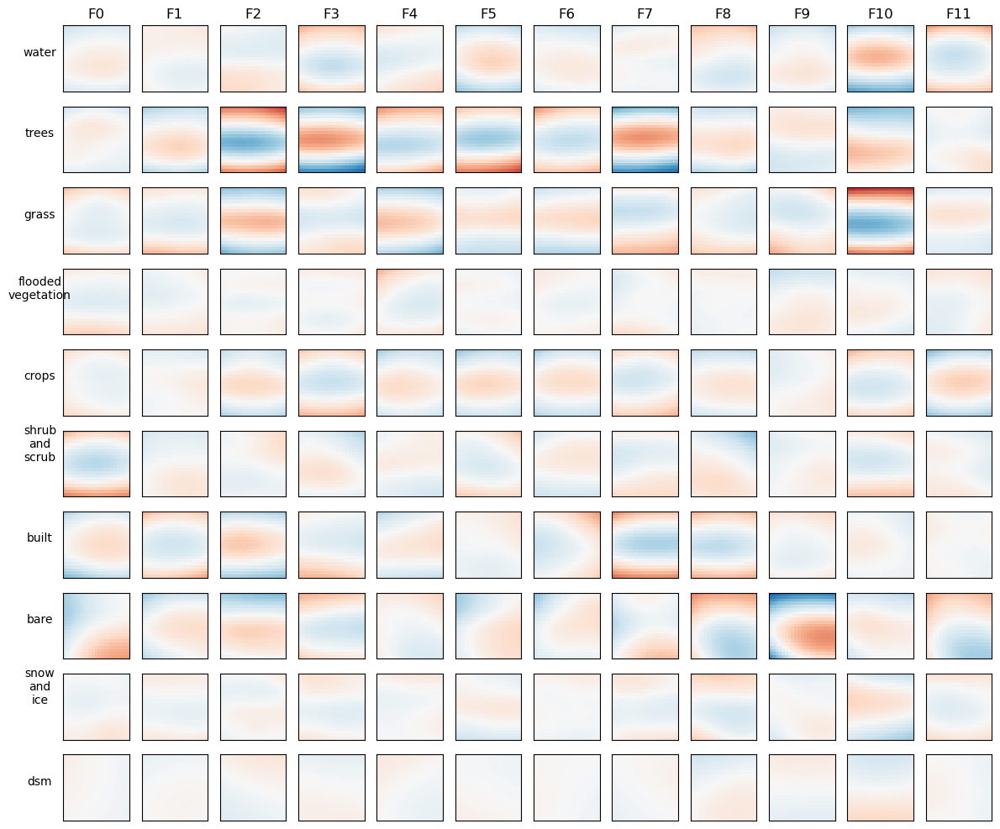

In [7]:
### PLOT RESULTS ###

# Plot a selection of stas
h_to_plot = len(all_stas)
f_to_plot = 12 # N_features
plt.figure(figsize=(f_to_plot, h_to_plot))
# Color plot borders by average value
# lim = np.nanmax(np.abs(all_stas[:h_to_plot, :f_to_plot]))
# Plot one tuning curve per hypothesis per feature
for row, hyp_stas in enumerate(all_stas[:h_to_plot]):
    for col, sta in enumerate(hyp_stas[:f_to_plot]):
        ax = plt.subplot(h_to_plot, f_to_plot, row * f_to_plot + col + 1)
        plot_sta(sta, ax=ax)
        if col == 0:
            ax.set_ylabel(names[row].replace('_','\n'), rotation=0, labelpad=20)
        if row == 0:
            ax.set_title(f'F{col}')
plt.tight_layout();
if not load and save_results:
    plt.savefig(os.path.join(base_dir, 'sta_dat.png'))
 

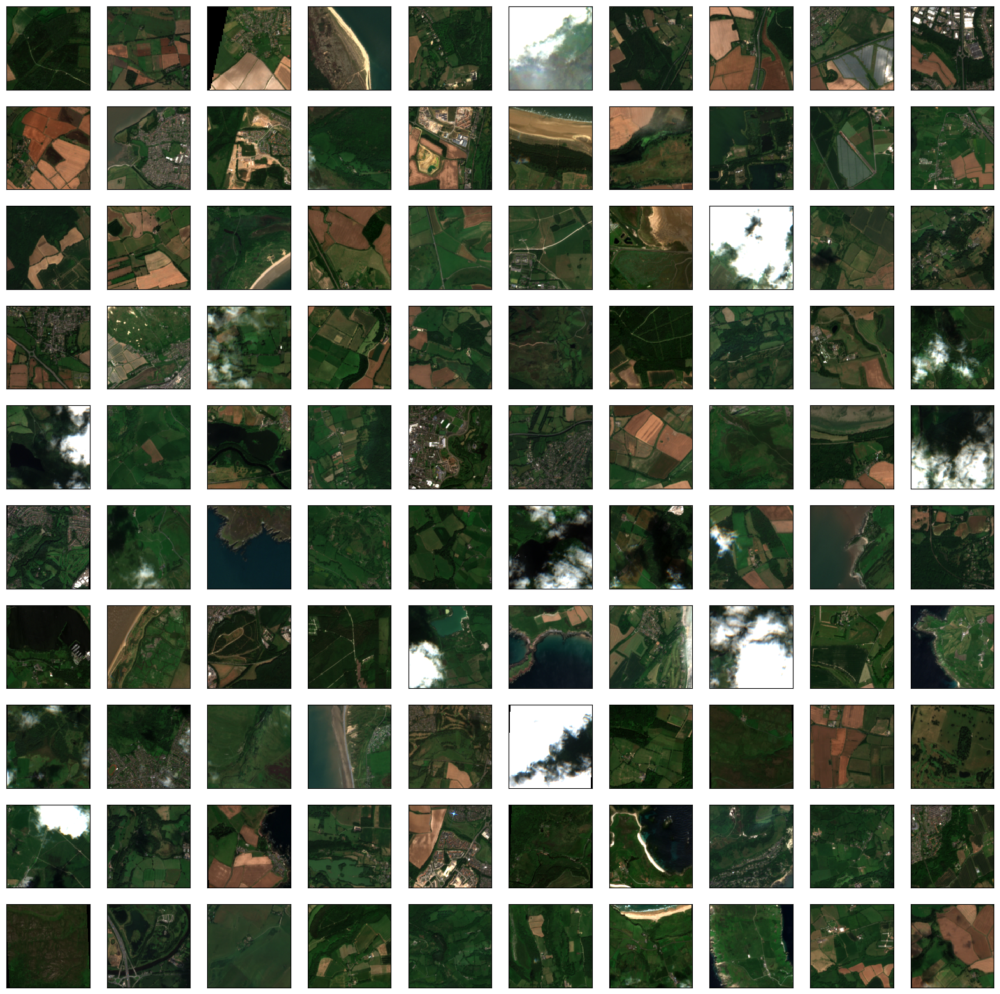

In [153]:
 # Plot the map for a particular feature that you might like across patches
cols=10
rows=int(np.ceil(patches/cols))
curr_f = 0
lim = np.nanmax(np.abs(np.stack(features, axis=-1)[curr_f]))
plt.figure(figsize=(2*cols, 2*rows))
for p, feature in enumerate(features):
    ax = plt.subplot(rows, cols, p + 1)
    plot_sentinel(pictures[p], ax=ax)

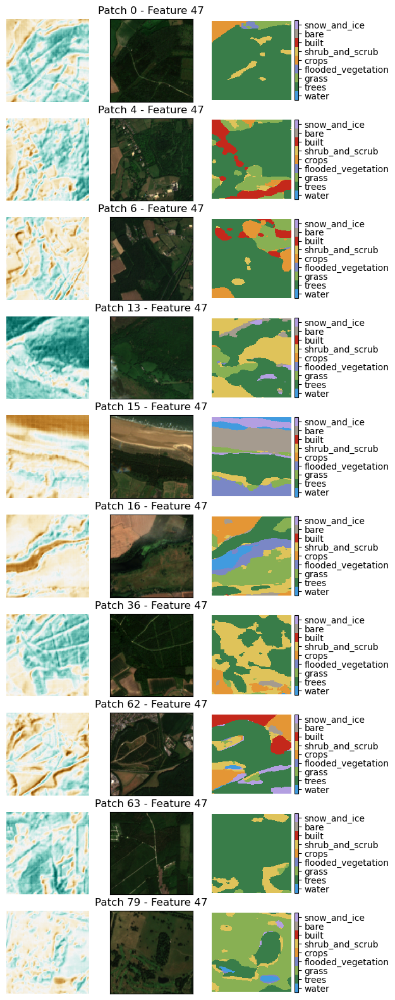

In [182]:
 # Plot the map for a particular feature that you might like across patches
from matplotlib.colors import ListedColormap
def plot_dw_landcover_from_hyp(hyp, ax=None):
    lc = hyp[:9, ...]
    im = np.argmax(lc, axis=0) 
    if ax is None:
        ax = plt.subplot(111)
    dict_classes = du.create_cmap_dynamic_world()
    cmap_dw = ListedColormap([v for v in dict_classes.values()])
    im = ax.imshow(im, cmap=cmap_dw, interpolation='none', origin='upper', vmax=8.5, vmin=-0.5)
    # Place colorbar outside of ax to avoid shrinking the imshow
    cbar = fig.colorbar(im, ax=ax, ticks=np.arange(0, 9), location='right', fraction=0.046, pad=0.04)
    cbar.ax.set_yticks(np.arange(0, 9))
    cbar.ax.set_yticklabels([k for k in dict_classes.keys()])
    ax.axis('off')

cols = 3
patch_list = [0, 4, 6, 13, 15, 16, 36, 62, 63, 79]
rows=len(patch_list)
curr_f = 47
fig, ax = plt.subplots(nrows=rows, ncols=cols,  figsize=(2*cols, 2*rows))
iplot = 0
for p in patch_list:
    feature = features[p]
    plot_feature(feature[curr_f], ax=ax[iplot,0])
    plot_sentinel(pictures[p], ax=ax[iplot,1])
    plot_dw_landcover_from_hyp(hypotheses[p], ax=ax[iplot,2])
    ax[iplot, 1].set_title(f'Patch {p} - Feature {curr_f}')
    iplot += 1

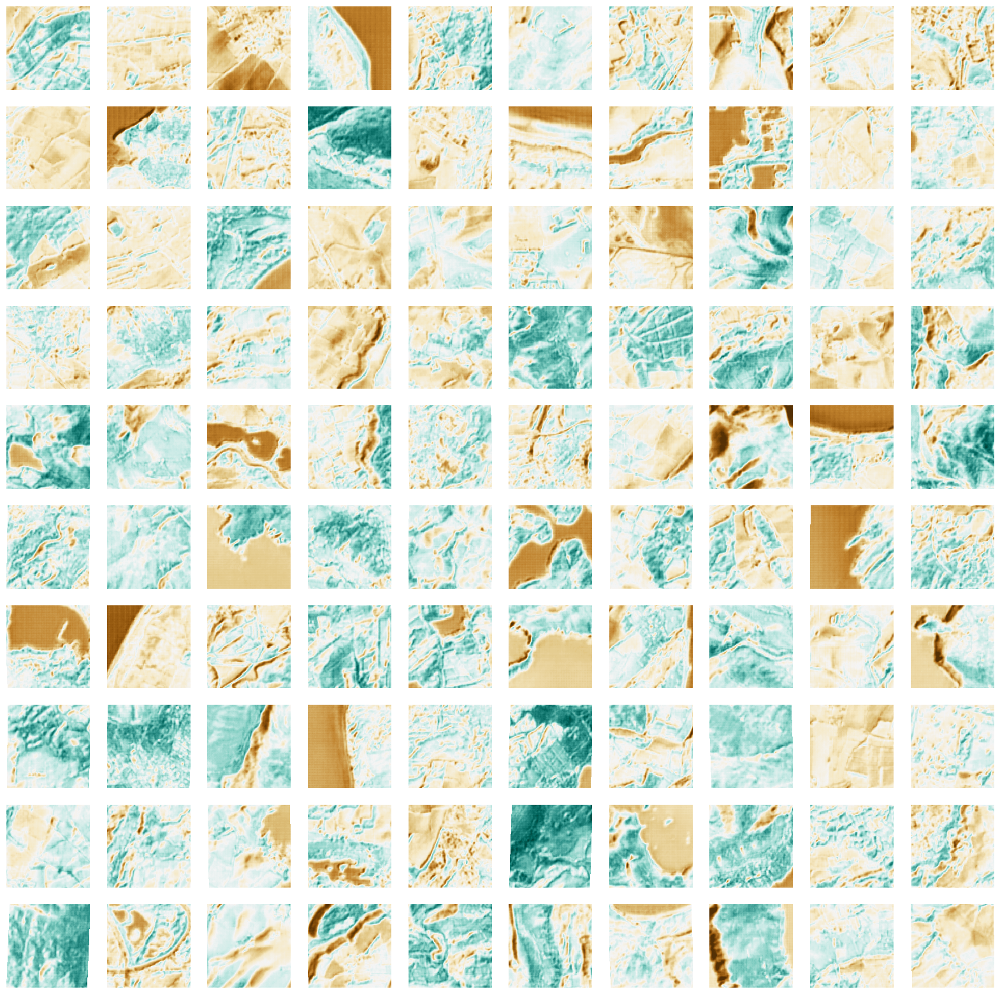

In [158]:
 # Plot the map for a particular feature that you might like across patches
cols=10
rows=int(np.ceil(patches/cols))
curr_f = 47
lim = np.nanmax(np.abs(np.stack(features, axis=-1)[curr_f]))
plt.figure(figsize=(2*cols, 2*rows))
for p, feature in enumerate(features):
    plt.subplot(rows, cols, p + 1)
    # plt.imshow(feature[curr_f], vmin=-lim, vmax=lim, cmap="RdBu_r")
    plot_feature(feature[curr_f])
    # plt.axis('off')
    

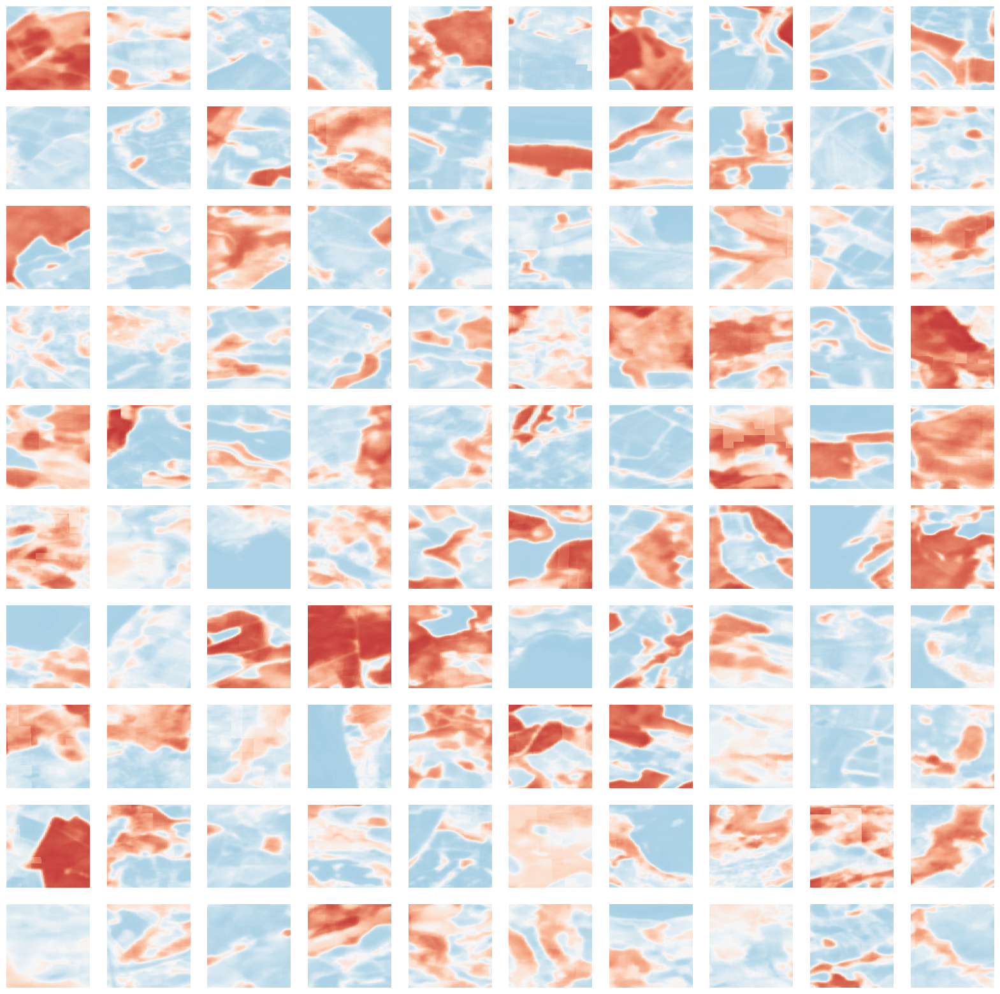

In [98]:
# Plot the map for a particular hypothesis that you might like across patches
cols=10
rows=int(np.ceil(patches/cols))
curr_h = 1
lim = np.nanmax(np.abs(np.stack(hypotheses, axis=-1)[curr_h]))
plt.figure(figsize=(2*cols, 2*rows))
for p, hypothesis in enumerate(hypotheses):
    plt.subplot(rows, cols, p + 1)
    # plt.imshow(hypothesis[curr_h], vmin=-lim, vmax=lim, cmap="RdBu_r")
    # plt.axis('off')    
    plot_feature(hypothesis[curr_h])

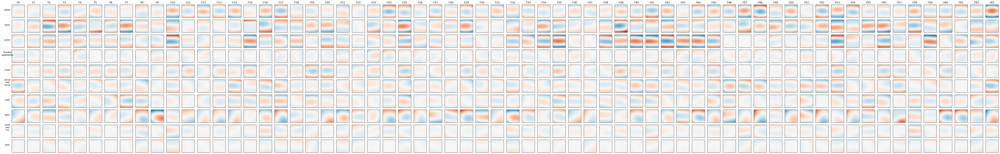

In [ ]:
# Plot fits for the same stas
plt.figure(figsize=(f_to_plot, h_to_plot))
# Color plot borders by average value
# lim = np.nanmax(snp.abs(all_fits[:h_to_plot, :f_to_plot]))
# Plot one tuning curve per hypothesis per feature
for row, hyp_fits in enumerate(all_fits[:h_to_plot]):
    for col, fit in enumerate(hyp_fits[:f_to_plot]):
        ax = plt.subplot(h_to_plot, f_to_plot, row * f_to_plot + col + 1)
        plot_sta(fit, ax=ax)
        if col == 0:
            ax.set_ylabel(names[row].replace('_','\n'), rotation=0, labelpad=20)
        if row == 0:
            ax.set_title(f'F{col}')
plt.tight_layout();            
if not load:
    plt.savefig(os.path.join(base_dir, 'sta_fit.png')) 

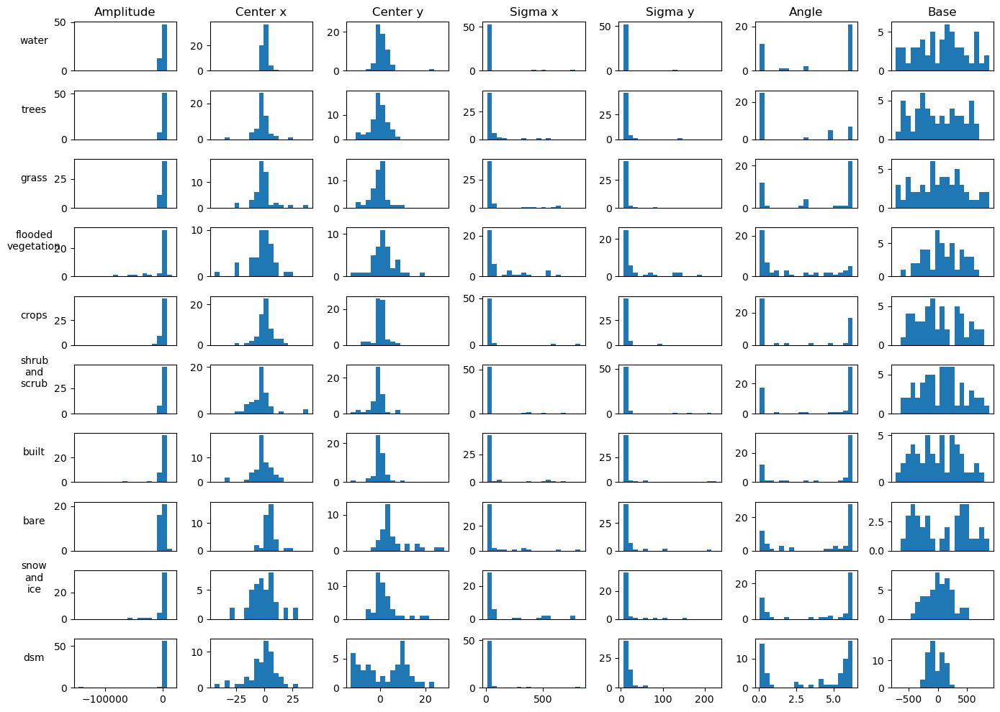

In [14]:

# Make overviews of all parameter histograms
plot_params = np.copy(all_params)
plot_params[:,:,1] -= radius
plot_params[:,:,2] -= radius
plot_params[:,:,3] = np.abs(plot_params[:,:,3])
plot_params[:,:,4] = np.abs(plot_params[:,:,4])
plot_params[:,:,5] = np.mod(plot_params[:,:,5], 2*np.pi)
param_names = ['Amplitude', 'Center x', 'Center y', 'Sigma x', 'Sigma y', 'Angle', 'Base'];
param_N_bins = 20;
param_bins = [np.linspace(np.percentile(plot_params[:,:,p], 10),
                          np.percentile(plot_params[:,:,p], 90), param_N_bins) 
              for p in range(plot_params.shape[-1])]
plt.figure(figsize=(2*plot_params.shape[-1], plot_params.shape[0]))
for h, hyp_par in enumerate(plot_params):
    for p, (p_name, p_bins) in enumerate(zip(param_names, param_bins)):
        ax = plt.subplot(plot_params.shape[0], plot_params.shape[-1], h*plot_params.shape[-1] + p + 1)
        plt.hist(hyp_par[:,p], p_bins)
        if p == 0:
            ax.set_ylabel(names[h].replace('_','\n'), rotation=0, labelpad=20)
        if h == 0:
            ax.set_title(p_name)
        if h < plot_params.shape[0] - 1:
            ax.set_xticks([])
plt.tight_layout()
if not load:
    plt.savefig(os.path.join(base_dir, 'sta_par.png'))      

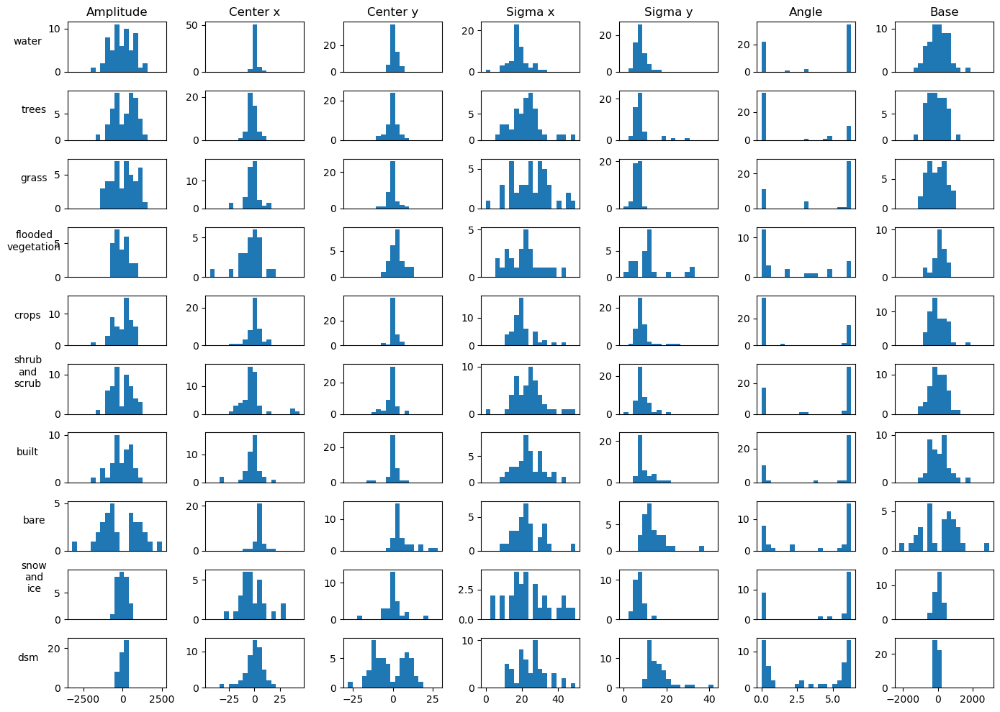

In [15]:

# Repeat for features with reasonable peak locations and sigmas
# This avoids fits where the sta is effectively a horizontal/vertical gradient
# so you need a huge gaussian (large radius, large amplitude, far away) to fit it
sta_to_plot = (np.abs(plot_params[:,:,1]) < radius*5) & \
    (np.abs(plot_params[:,:,2]) < radius*5) & \
    (plot_params[:,:,3] < radius * 5) & (plot_params[:,:,4] < radius * 5)
error = np.mean(np.abs(all_stas - all_fits).reshape([N_hypotheses,N_features,-1]),axis=-1)
filtered_params = np.copy(plot_params)
filtered_params[~np.tile(sta_to_plot[:,:,None], [1,1,7])] = np.nan

param_bins = [np.linspace(np.nanmin(filtered_params[:,:,p]), np.nanmax(filtered_params[:,:,p]), param_N_bins)
              for p in range(filtered_params.shape[-1])]
plt.figure(figsize=(2*plot_params.shape[-1], plot_params.shape[0]))
for h, hyp_par in enumerate(filtered_params):
    for p, (p_name, p_bins) in enumerate(zip(param_names, param_bins)):
        ax = plt.subplot(plot_params.shape[0], plot_params.shape[-1], h*plot_params.shape[-1] + p + 1)
        plt.hist(hyp_par[:,p], p_bins)
        if p == 0:
            ax.set_ylabel(names[h].replace('_','\n'), rotation=0, labelpad=20)
        if h == 0:
            ax.set_title(p_name)
        if h < plot_params.shape[0] - 1:
            ax.set_xticks([])
plt.tight_layout() 

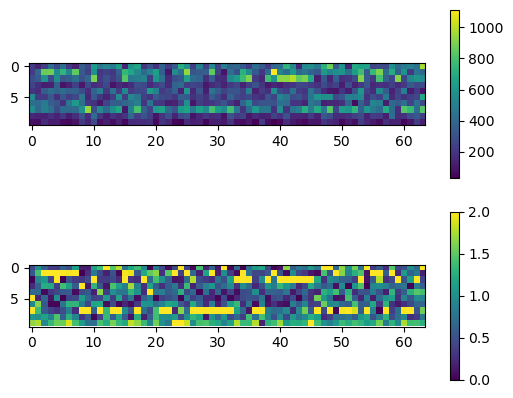

In [16]:

# Calculate tuning strength to each hypothesis for each feature
# It's a pretty rough estimate of tuning: 
# How many stds is one hyp's amplitude from the mean of other hyp amplitudes
tuning_strength = np.zeros((N_hypotheses, N_features))
amp_feat = np.max(all_stas.reshape([N_hypotheses, N_features, -1]), axis=-1) - np.min(all_stas.reshape([N_hypotheses, N_features, -1]), axis=-1)
for h in range(N_hypotheses):
    hyp_self = np.eye(N_hypotheses)[h].astype(np.bool)
    self_amp = amp_feat[h]
    other_mean = np.nanmean(amp_feat[~hyp_self], axis=0)
    other_std = np.nanstd(amp_feat[~hyp_self], axis=0)
    tuning_strength[h,:] = np.abs(self_amp - other_mean) / other_std
# Plot average response and significant tuning
plt.figure()
plt.subplot(2,1,1);
plt.imshow(amp_feat)
plt.colorbar()
plt.subplot(2,1,2);
plt.imshow(tuning_strength, vmin=0, vmax=2)
plt.colorbar()

Text(0.5, 1.0, 'F8 map')

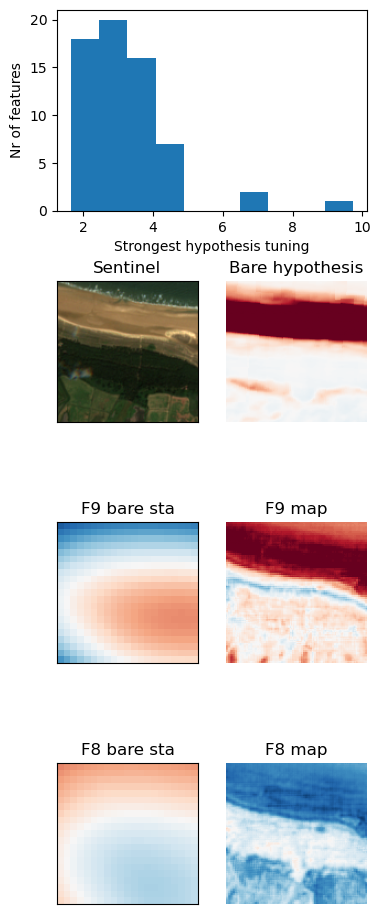

In [61]:
feat1, feat2 = 9, 8

# Plot distribution of strongest tuning across features
sta_lim = np.nanmax(np.abs(all_stas))
feat_lim = np.nanmax(np.abs(all_stas))
plt.figure(figsize=(4,12));
plt.subplot(4,1,1)
plt.hist(np.max(tuning_strength, axis=0));
plt.xlabel('Strongest hypothesis tuning')
plt.ylabel('Nr of features')

# Plot a strongly tuned example
ax = plt.subplot(4,2,3);
plot_sentinel(pictures[15], ax=ax)
plt.title('Sentinel')

ax =plt.subplot(4,2,4);
plot_feature(hypotheses[15][7], ax=ax)
plt.title('Bare hypothesis')

# Plot the feature that shows strong bare tuning
ax = plt.subplot(4,2,5)
plot_sta(all_stas[7,feat1], ax=ax)
plt.title(f'F{feat1} bare sta')

ax = plt.subplot(4,2,6)
plot_feature(features[15][feat1], ax=ax)
plt.title(f'F{feat1} map')

# Plot the feature that shows weak bare tuning
ax = plt.subplot(4,2,7)
plot_sta(all_stas[7,feat2], ax=ax)
plt.title(f'F{feat2} bare sta')

ax = plt.subplot(4,2,8)
plot_feature(features[15][feat2], ax=ax)
plt.title(f'F{feat2} map')

Text(0.5, 1.0, 'F62 map')

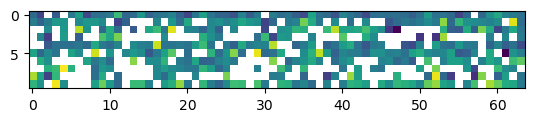

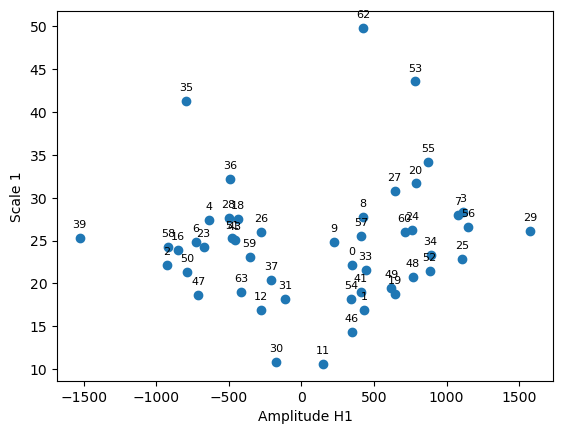

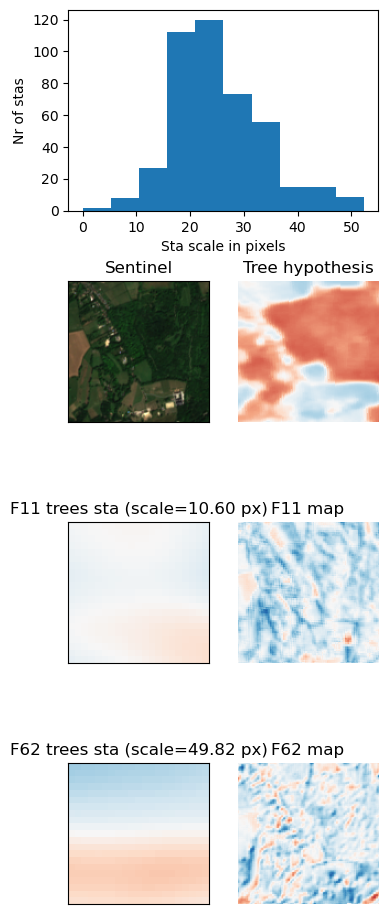

In [105]:
feat1, feat2 = 11, 62
ind_h = 1
ind_patch = 4
# Calculate scale: average between x and y sigma, only from reasonable fits
# scale = np.mean(filtered_params[:,:,3:5], axis=-1)
scale = np.sqrt(filtered_params[:,:,3] ** 2 + filtered_params[:,:,4] ** 2)
plt.figure()
plt.imshow(scale)

plt.figure()
ampl_h = filtered_params[ind_h, ...][:, 0]
scale_h = scale[ind_h, ...]

# plot points (skip nan)
valid = np.isfinite(ampl_h) & np.isfinite(scale_h)
plt.plot(ampl_h[valid], scale_h[valid], 'o')
plt.xlabel(f'Amplitude H{ind_h}')
# annotate each plotted point with its index above the marker
for i, (x, y) in enumerate(zip(ampl_h, scale_h)):
    if not (np.isfinite(x) and np.isfinite(y)):
        continue
    plt.annotate(str(i), xy=(x, y), xytext=(0, 6), textcoords='offset points',
                 ha='center', va='bottom', fontsize=8)
plt.ylabel(f'Scale {ind_h}')

# Plot scale across stas
plt.figure(figsize=(4,12));
plt.subplot(4,1,1)
plt.hist(scale[sta_to_plot]);
plt.xlabel('Sta scale in pixels')
plt.ylabel('Nr of stas')

# Plot a short and long scale example
ax = plt.subplot(4,2,3);
plot_sentinel(pictures[ind_patch], ax=ax)
plt.title('Sentinel')

ax = plt.subplot(4,2,4);
plot_feature(hypotheses[ind_patch][ind_h], ax=ax)
plt.title('Tree hypothesis')

# Plot the feature with short scale
ax = plt.subplot(4,2,5)
plot_sta(all_stas[ind_h,feat1], ax=ax)
plt.title(f'F{feat1} trees sta (scale={scale[ind_h,feat1]:.2f} px)')

ax = plt.subplot(4,2,6);
plot_feature(features[ind_patch][feat1], ax=ax)
plt.title(f'F{feat1} map')

# Plot the feature with long scale
ax = plt.subplot(4,2,7)
plot_sta(all_stas[ind_h,feat2], ax=ax)
plt.title(f'F{feat2} trees sta (scale={scale[ind_h,feat2]:.2f} px)')

ax = plt.subplot(4,2,8);
plot_feature(features[ind_patch][feat2], ax=ax)
plt.title(f'F{feat2} map')

Text(0.5, 1.0, 'F14 map')

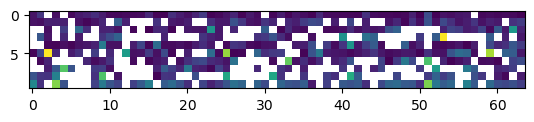

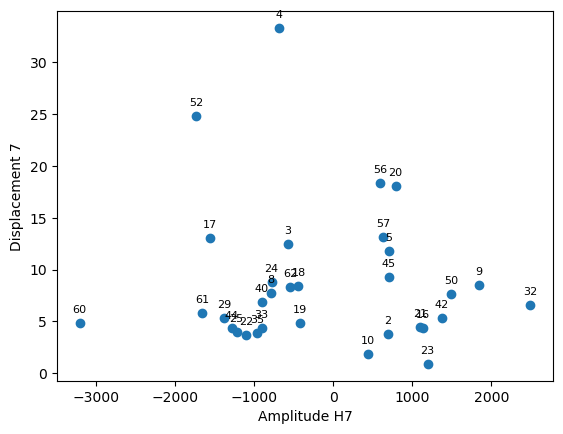

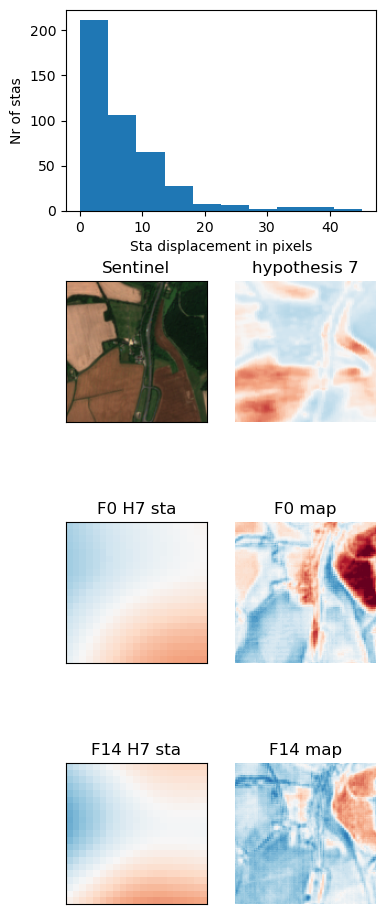

In [118]:
feat1, feat2 = 0, 14
ind_h = 7
ind_patch = 7

# Calculate displacement: peak to center distance
displacement = np.sqrt(filtered_params[:,:,1]**2 + filtered_params[:,:,2]**2)
plt.figure()
plt.imshow(displacement)

plt.figure()
ampl_h = filtered_params[ind_h, ...][:, 0]
displacement_h = displacement[ind_h, ...]

# plot points (skip nan)
valid = np.isfinite(ampl_h) & np.isfinite(displacement_h)
plt.plot(ampl_h[valid], displacement_h[valid], 'o')
plt.xlabel(f'Amplitude H{ind_h}')
# annotate each plotted point with its index above the marker
for i, (x, y) in enumerate(zip(ampl_h, displacement_h)):
    if not (np.isfinite(x) and np.isfinite(y)):
        continue
    plt.annotate(str(i), xy=(x, y), xytext=(0, 6), textcoords='offset points',
                 ha='center', va='bottom', fontsize=8)
plt.ylabel(f'Displacement {ind_h}')

# Plot displacement across stas
plt.figure(figsize=(4,12));
plt.subplot(4,1,1)
plt.hist(displacement[sta_to_plot]);
plt.xlabel('Sta displacement in pixels')
plt.ylabel('Nr of stas')

# Plot a short and long scale example
ax = plt.subplot(4,2,3);
plot_sentinel(pictures[ind_patch], ax=ax)
plt.title('Sentinel')

ax = plt.subplot(4,2,4);
plot_feature(hypotheses[ind_patch][ind_h], ax=ax)
plt.title(f'hypothesis {ind_h}')

# Plot the feature with small displacement
ax = plt.subplot(4,2,5)
plot_sta(all_stas[ind_h,feat1], ax=ax)
plt.title(f'F{feat1} H{ind_h} sta')
ax = plt.subplot(4,2,6);
plot_feature(features[ind_patch][feat1], ax=ax)
plt.title(f'F{feat1} map')
# Plot the feature with large displacement
ax = plt.subplot(4,2,7)
plot_sta(all_stas[ind_h,feat2], ax=ax)
plt.title(f'F{feat2} H{ind_h} sta')

ax = plt.subplot(4,2,8);
plot_feature(features[ind_patch][feat2], ax=ax)
plt.title(f'F{feat2} map')

/var/folders/kh/y9z_055x6gq8gc74b6y16r1c0000gn/T/ipykernel_74460/1342098406.py:8: RuntimeWarning: invalid value encountered in divide
  eccentricity = np.sqrt(1-(b/a)**2)


Text(0.5, 1.0, 'F49 map')

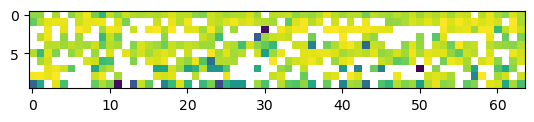

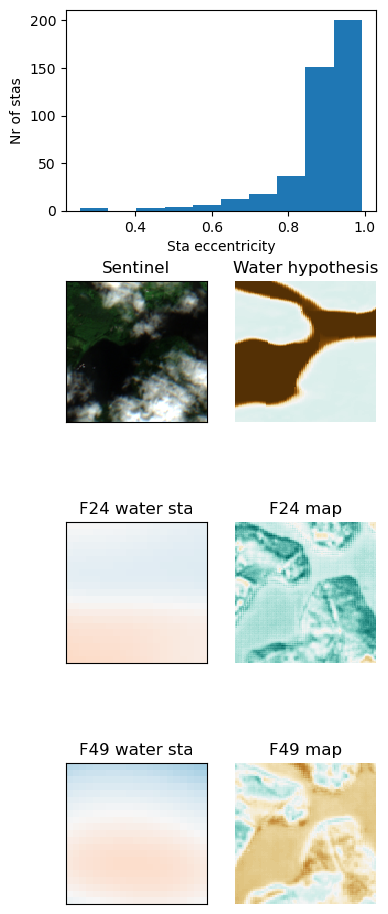

In [170]:
feat1, feat2 = 2, 21
ind_h = 0
ind_patch = 55

# Calculate symmetry: eccentricity
a = np.max(filtered_params[:,:,3:5], axis=-1)
b = np.min(filtered_params[:,:,3:5], axis=-1)
eccentricity = np.sqrt(1-(b/a)**2)
plt.figure()
plt.imshow(eccentricity)

# Plot eccentricity across stas
plt.figure(figsize=(4,12));
plt.subplot(4,1,1)
plt.hist(eccentricity[sta_to_plot]);
plt.xlabel('Sta eccentricity')
plt.ylabel('Nr of stas')
# Plot a short and long scale example
ax = plt.subplot(4,2,3);
plot_sentinel(pictures[ind_patch], ax=ax)
plt.title('Sentinel')

ax = plt.subplot(4,2,4);
plot_feature(hypotheses[ind_patch][ind_h], ax=ax)
plt.title('Water hypothesis')

# Plot the feature with small eccentricity
ax = plt.subplot(4,2,5)
plot_sta(all_stas[ind_h,feat1], ax=ax)
plt.title('F24 water sta')

ax = plt.subplot(4,2,6);
plot_feature(features[ind_patch][feat1], ax=ax)
plt.title('F24 map')

# Plot the feature with large eccentiricty
ax = plt.subplot(4,2,7)
plot_sta(all_stas[ind_h,feat2], ax=ax)
plt.title('F49 water sta')

ax = plt.subplot(4,2,8);
plot_feature(features[ind_patch][feat2], ax=ax)
plt.title('F49 map')

Text(0, 0.5, 'Nr of stas')

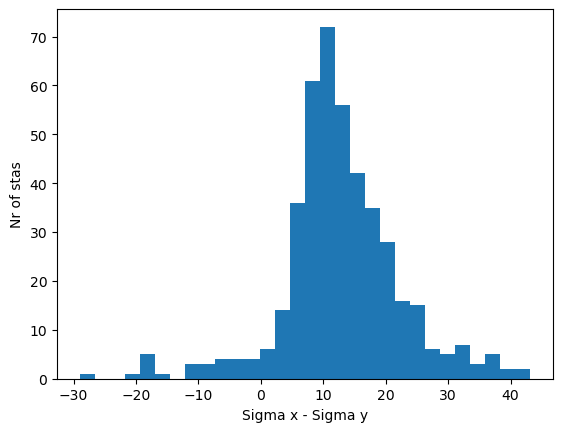

In [177]:
plt.hist(np.ravel(filtered_params[:, :, 3] - filtered_params[:, :, 4]), bins=30);
plt.xlabel('Sigma x - Sigma y')
plt.ylabel('Nr of stas')

# Fig 2

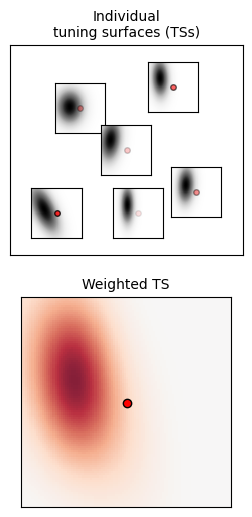

In [422]:

def random_gaussian_blob(size=100):
    x, y = np.mgrid[-3:3:size*1j, -3:3:size*1j]  # grid

    # random mean
    mean = np.random.uniform(-2, 0, 2)

    # random covariance matrix -> elongated shapes
    A = np.random.randn(2, 2) / 2
    cov = np.dot(A, A.T)  # positive semi-definite
    cov += np.diag([2, 0.3])  # encourage elongation

    inv_cov = np.linalg.inv(cov)

    pos = np.dstack((x - mean[0], y - mean[1]))
    blob = np.exp(-0.5 * np.einsum('...i,ij,...j->...', pos, inv_cov, pos))
    return blob / blob.max()  # normalize

def plot_sta_example(ax_top=None, ax_bottom=None):
    if ax_top is None or ax_bottom is None:
        fig, ax = plt.subplots(2, 1, figsize=(3, 6))
        ax_top = ax[0]
        ax_bottom = ax[1]
    
    size = 0.12
    centres_inset = [(0.2, 0.2), (0.7, 0.8), (0.8, 0.3), (0.3, 0.7), (0.5, 0.5), (0.55, 0.2)]
    weights = [0.8, 0.6, 0.4, 0.3, 0.2, 0.1]
    blobs = [random_gaussian_blob() for _ in range(len(centres_inset))]

    for i in range(len(centres_inset)):
        ax_inset = ax_top.inset_axes([centres_inset[i][0] - size, centres_inset[i][1] - size, 2 * size, 2 * size])
        ax_inset.set_xticks([])
        ax_inset.set_yticks([])
        ax_inset.imshow(blobs[i], cmap='Grays', interpolation='none')
        ax_inset.plot(50, 50, 'ro', markersize=4, markeredgecolor='k', alpha=weights[i])
    ax_top.set_xticks([])
    ax_top.set_yticks([])
    ax_top.set_title('Individual\ntuning surfaces (TSs)', fontsize=10)

    ax_bottom.imshow(np.stack([b * weights[j] for j, b in enumerate(blobs)]).mean(0), 
                     cmap='RdBu_r', interpolation='none', alpha=0.9, vmin=-0.4, vmax=0.4)
    ax_bottom.set_xticks([])
    ax_bottom.set_yticks([])
    ax_bottom.plot(50, 50, 'ro', markersize=6, markeredgecolor='k')
    ax_bottom.set_title('Weighted TS', fontsize=10)

plot_sta_example()

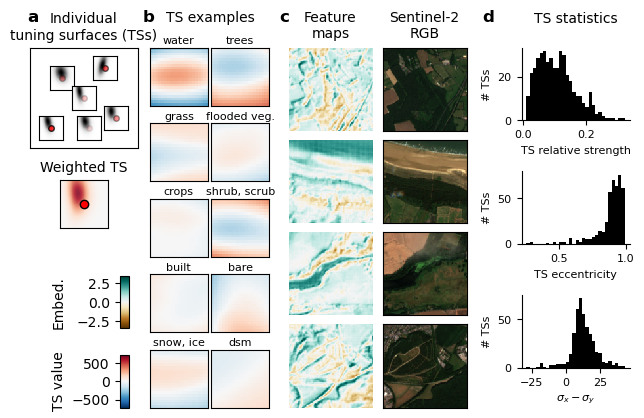

In [435]:
 # Plot the map for a particular feature that you might like across patches

save_fig = True

def plot_dw_landcover_from_hyp(hyp, ax=None, plot_cbar=False, cax=None):
    lc = hyp[:9, ...]
    im = np.argmax(lc, axis=0) 
    if ax is None:
        ax = plt.subplot(111)
    dict_classes = du.create_cmap_dynamic_world()
    cmap_dw = ListedColormap([v for v in dict_classes.values()])
    im = ax.imshow(im, cmap=cmap_dw, interpolation='none', origin='upper', vmax=8.5, vmin=-0.5)
    if plot_cbar:
        # Place colorbar outside of ax to avoid shrinking the imshow
        cbar = fig.colorbar(im, ax=ax, ticks=np.arange(0, 9), cax=cax, location='right', fraction=0.046, pad=0.04)
        cbar.ax.set_yticks(np.arange(0, 9))
        cbar.ax.set_yticklabels([k for k in dict_classes.keys()])
    ax.axis('off')

patch_list = [6, 15, 16, 62] # [0, 4, 6, 13, 15, 16, 36, 62, 63, 79]
rows=len(patch_list)
curr_f = 47


fig = plt.figure(figsize=(6, 4))
gs_topleft = fig.add_gridspec(nrows=1, ncols=1, left=0.0, right=0.18, bottom=0.65, top=0.9)
ax_topleft = gs_topleft.subplots()
gs_middleleft = fig.add_gridspec(nrows=1, ncols=1, left=0.05, right=0.13, bottom=0.45, top=0.57)
ax_middleleft = gs_middleleft.subplots()
gs_cbar_bottomleft = fig.add_gridspec(nrows=2, ncols=1, left=0.15, right=0.165, bottom=0, top=0.33, hspace=0.5)
ax_cbar_bottomleft = gs_cbar_bottomleft.subplots()
gs_left = fig.add_gridspec(nrows=5, ncols=2, left=0.2, right=0.4, bottom=0, top=0.9, wspace=0.05, hspace=0.3)
ax_left = gs_left.subplots()
gs_middle = fig.add_gridspec(nrows=len(patch_list), ncols=2, left=0.43, right=0.73, bottom=0, top=0.9, wspace=0.1, hspace=0.1)
ax_middle = gs_middle.subplots()
gs_right = fig.add_gridspec(nrows=3, ncols=1, left=0.82, right=1, bottom=0.1, top=0.9, wspace=0.2, hspace=0.7)
ax_right = gs_right.subplots()

## Example
plot_sta_example(ax_top=ax_topleft, ax_bottom=ax_middleleft)

## STAs:
ax_left = ax_left.flatten()
stas_feat = np.squeeze(all_stas[:, curr_f, :, :])
h_names = du.get_hyp_names()
h_names = [h.replace('flooded_vegetation', 'flooded veg.').replace('shrub_and_scrub', 'shrub, scrub').replace('snow_and_ice', 'snow, ice') for h in h_names]
for iplot, ax in enumerate(ax_left):
    plot_sta(stas_feat[iplot], ax=ax, plot_cbar=(iplot==8), cax=ax_cbar_bottomleft[1] if iplot==8 else None)
    ax.set_title(f'{h_names[iplot].replace('_', ' ')}', fontsize=8, y=0.92)

## Example patches:
iplot = 0
for p in patch_list:
    feature = features[p]
    plot_feature(feature[curr_f], ax=ax_middle[iplot][0], plot_cbar=(iplot==0), cax=ax_cbar_bottomleft[0])
    plot_sentinel(pictures[p], ax=ax_middle[iplot][1])
    # plot_dw_landcover_from_hyp(hypotheses[p], ax=ax[iplot,2], plot_cbar=(iplot==0))
    # ax_middle[iplot, 1].set_title(f'Patch {p} - Feature {curr_f}')
    iplot += 1

## Statistics:
# Tuning strength histogram
ax = ax_right[0]
amp_feat = np.max(np.abs(all_stas.reshape([N_hypotheses, N_features, -1])), axis=-1)
amp_feat_rel = amp_feat / amp_feat.sum(axis=0, keepdims=True)
    
ax.hist(np.ravel(amp_feat_rel[sta_to_plot]), bins=30, color='k')
# ax.hist(np.max(tuning_strength, axis=0), bins=20, color='k')
ax.set_xlabel('TS relative strength', fontsize=8)
ax.set_ylabel('# TSs', fontsize=8)
ax.tick_params(axis='both', which='major', labelsize=8)
du.despine(ax=ax)

## Eccentricity histogram
ax = ax_right[1]
ax.hist(eccentricity[sta_to_plot], bins=30, color='k')
ax.set_xlabel('TS eccentricity', fontsize=8)
ax.set_ylabel('# TSs', fontsize=8)
ax.tick_params(axis='both', which='major', labelsize=8)
du.despine(ax=ax)

ax = ax_right[2]
ax.hist(np.ravel(filtered_params[:, :, 3] - filtered_params[:, :, 4]), bins=30, color='k')
ax.set_xlabel(r"$\sigma_x - \sigma_y$", fontsize=8)
ax.set_ylabel('# TSs', fontsize=8)
ax.tick_params(axis='both', which='major', labelsize=8)
du.despine(ax=ax)


sys.path.append('/Users/tplas/repos/reproducible_figures/scripts')
import rep_fig_vis as rfv
rfv.add_panel_label(fig=fig, ax=ax_topleft, label_letter='a', x_offset=0.08, y_offset=0.23, fontsize=12)
rfv.add_panel_label(fig=fig, ax=ax_topleft, label_letter='b', x_offset=1.16, y_offset=0.23, fontsize=12)
rfv.add_panel_label(fig=fig, ax=ax_topleft, label_letter='c', x_offset=2.4, y_offset=0.23, fontsize=12)
rfv.add_panel_label(fig=fig, ax=ax_topleft, label_letter='d', x_offset=4.3, y_offset=0.23, fontsize=12)

ax_left[0].annotate('TS examples', xy=(1.05, 1.45), xycoords='axes fraction', ha='center', fontsize=10)
ax_middle[0][0].annotate('Feature\nmaps', xy=(0.5, 1.12), xycoords='axes fraction', ha='center', fontsize=10)
ax_middle[0][1].annotate('Sentinel-2\nRGB', xy=(0.5, 1.12), xycoords='axes fraction', ha='center', fontsize=10)
ax_right[0].annotate('TS statistics\n', xy=(0.5, 1.12), xycoords='axes fraction', ha='center', fontsize=10)

fig.align_ylabels(ax_cbar_bottomleft)
fig.align_ylabels(ax_right)

if save_fig:
    fig.savefig('../figs/fig2.pdf', bbox_inches='tight')
    plt.savefig('../../ms_neureo/figs/fig2.pdf', bbox_inches='tight')

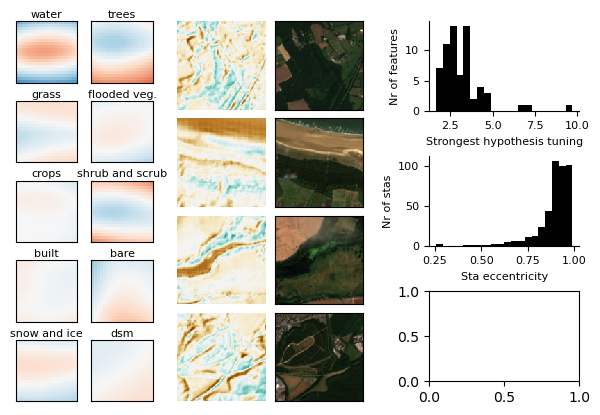

In [394]:
 # Plot the map for a particular feature that you might like across patches

def plot_dw_landcover_from_hyp(hyp, ax=None, plot_cbar=False, cax=None):
    lc = hyp[:9, ...]
    im = np.argmax(lc, axis=0) 
    if ax is None:
        ax = plt.subplot(111)
    dict_classes = du.create_cmap_dynamic_world()
    cmap_dw = ListedColormap([v for v in dict_classes.values()])
    im = ax.imshow(im, cmap=cmap_dw, interpolation='none', origin='upper', vmax=8.5, vmin=-0.5)
    if plot_cbar:
        # Place colorbar outside of ax to avoid shrinking the imshow
        cbar = fig.colorbar(im, ax=ax, ticks=np.arange(0, 9), cax=cax, location='right', fraction=0.046, pad=0.04)
        cbar.ax.set_yticks(np.arange(0, 9))
        cbar.ax.set_yticklabels([k for k in dict_classes.keys()])
    ax.axis('off')

patch_list = [6, 15, 16, 62] # [0, 4, 6, 13, 15, 16, 36, 62, 63, 79]
rows=len(patch_list)
curr_f = 47


fig = plt.figure(figsize=(6, 4))
gs_left = fig.add_gridspec(nrows=5, ncols=2, left=0.0, right=0.25, bottom=0, top=0.95, wspace=0.02, hspace=0.3)
ax_left = gs_left.subplots()
gs_middle = fig.add_gridspec(nrows=len(patch_list), ncols=2, left=0.28, right=0.59, bottom=0, top=0.95, wspace=0.1, hspace=0.1)
ax_middle = gs_middle.subplots()
gs_right = fig.add_gridspec(nrows=3, ncols=1, left=0.7, right=0.95, bottom=0.05, top=0.95, wspace=0.2, hspace=0.5)
ax_right = gs_right.subplots()

## STAs:
ax_left = ax_left.flatten()
stas_feat = np.squeeze(all_stas[:, curr_f, :, :])
h_names = du.get_hyp_names()
h_names = [h.replace('flooded_vegetation', 'flooded veg.') for h in h_names]
for iplot, ax in enumerate(ax_left):
    plot_sta(stas_feat[iplot], ax=ax)
    ax.set_title(f'{h_names[iplot].replace('_', ' ')}', fontsize=8, y=0.92)

## Example patches:
iplot = 0
for p in patch_list:
    feature = features[p]
    plot_feature(feature[curr_f], ax=ax_middle[iplot][0])
    plot_sentinel(pictures[p], ax=ax_middle[iplot][1])
    # plot_dw_landcover_from_hyp(hypotheses[p], ax=ax[iplot,2], plot_cbar=(iplot==0))
    # ax_middle[iplot, 1].set_title(f'Patch {p} - Feature {curr_f}')
    iplot += 1

## Statistics:
# Tuning strength histogram
ax = ax_right[0]
ax.hist(np.max(tuning_strength, axis=0), bins=20, color='k')
ax.set_xlabel('Strongest hypothesis tuning', fontsize=8)
ax.set_ylabel('Nr of features', fontsize=8)
ax.tick_params(axis='both', which='major', labelsize=8)
du.despine(ax=ax)

## Eccentricity histogram
ax = ax_right[1]
ax.hist(eccentricity[sta_to_plot], bins=20, color='k')
ax.set_xlabel('Sta eccentricity', fontsize=8)
ax.set_ylabel('Nr of stas', fontsize=8)
ax.tick_params(axis='both', which='major', labelsize=8)
du.despine(ax=ax)
